# COVID-19 CASES: NORWAY VS WORLDWIDE VS US

# Importing Necessary Libraries

In [175]:
# for dataset handeling and calculations
import numpy as np 
import pandas as pd 

# for basic visualizations
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
%matplotlib inline 

# for advanced visualizations
import seaborn as sns

# for interactive visualizations
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# for offline ploting 
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

# to hide warnings
import warnings
warnings.filterwarnings('ignore')

# for date and time operations
from datetime import datetime,timedelta

# for file and folder operations
import os

In [176]:
# for modelling
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OrdinalEncoder
#from statsmodels.tsa.arima_model import ARIMA
#from fbprophet import Prophet
#from fbprophet.plot import plot_plotly, add_changepoints_to_plot
from sklearn.preprocessing import MinMaxScaler
#import tensorflow as tf
#from tensorflow import keras

np.random.seed(42)

# Loading the Datasets

In [177]:
# Loading the datasets

country_wise_latest_df = pd.read_csv('country_wise_latest.csv')
worldometer_data_df = pd.read_csv('worldometer_data.csv')
day_wise_df = pd.read_csv('day_wise.csv')
full_grouped_df = pd.read_csv('full_grouped.csv')
usa_county_wise_df = pd.read_csv('usa_county_wise.csv')
covid_19_clean_complete_df = pd.read_csv('covid_19_clean_complete.csv')

# Checking for Data Types

In [55]:
country_wise_latest_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Confirmed               187 non-null    int64  
 2   Deaths                  187 non-null    int64  
 3   Recovered               187 non-null    int64  
 4   Active                  187 non-null    int64  
 5   New cases               187 non-null    int64  
 6   New deaths              187 non-null    int64  
 7   New recovered           187 non-null    int64  
 8   Deaths / 100 Cases      187 non-null    float64
 9   Recovered / 100 Cases   187 non-null    float64
 10  Deaths / 100 Recovered  187 non-null    float64
 11  Confirmed last week     187 non-null    int64  
 12  1 week change           187 non-null    int64  
 13  1 week % increase       187 non-null    float64
 14  WHO Region              187 non-null    ob

In [56]:
worldometer_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country/Region    209 non-null    object 
 1   Continent         208 non-null    object 
 2   Population        208 non-null    float64
 3   TotalCases        209 non-null    int64  
 4   NewCases          4 non-null      float64
 5   TotalDeaths       188 non-null    float64
 6   NewDeaths         3 non-null      float64
 7   TotalRecovered    205 non-null    float64
 8   NewRecovered      3 non-null      float64
 9   ActiveCases       205 non-null    float64
 10  Serious,Critical  122 non-null    float64
 11  Tot Cases/1M pop  208 non-null    float64
 12  Deaths/1M pop     187 non-null    float64
 13  TotalTests        191 non-null    float64
 14  Tests/1M pop      191 non-null    float64
 15  WHO Region        184 non-null    object 
dtypes: float64(12), int64(1), object(3)
memory u

In [57]:
day_wise_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    188 non-null    object 
 1   Confirmed               188 non-null    int64  
 2   Deaths                  188 non-null    int64  
 3   Recovered               188 non-null    int64  
 4   Active                  188 non-null    int64  
 5   New cases               188 non-null    int64  
 6   New deaths              188 non-null    int64  
 7   New recovered           188 non-null    int64  
 8   Deaths / 100 Cases      188 non-null    float64
 9   Recovered / 100 Cases   188 non-null    float64
 10  Deaths / 100 Recovered  188 non-null    float64
 11  No. of countries        188 non-null    int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 17.8+ KB


In [58]:
full_grouped_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            35156 non-null  object
 1   Country/Region  35156 non-null  object
 2   Confirmed       35156 non-null  int64 
 3   Deaths          35156 non-null  int64 
 4   Recovered       35156 non-null  int64 
 5   Active          35156 non-null  int64 
 6   New cases       35156 non-null  int64 
 7   New deaths      35156 non-null  int64 
 8   New recovered   35156 non-null  int64 
 9   WHO Region      35156 non-null  object
dtypes: int64(7), object(3)
memory usage: 2.7+ MB


In [59]:
usa_county_wise_df.dtypes

UID                 int64
iso2               object
iso3               object
code3               int64
FIPS              float64
Admin2             object
Province_State     object
Country_Region     object
Lat               float64
Long_             float64
Combined_Key       object
Date               object
Confirmed           int64
Deaths              int64
dtype: object

In [60]:
covid_19_clean_complete_df.dtypes

Province/State     object
Country/Region     object
Lat               float64
Long              float64
Date               object
Confirmed           int64
Deaths              int64
Recovered           int64
Active              int64
WHO Region         object
dtype: object

# Getting Statistical table

In [61]:
country_wise_latest_df.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
count,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000,187.00,1.870000e+02,187.000000,187.000000
mean,8.813094e+04,3497.518717,5.063148e+04,3.400194e+04,1222.957219,28.957219,933.812834,3.019519,64.820535,inf,7.868248e+04,9448.459893,13.606203
std,3.833187e+05,14100.002482,1.901882e+05,2.133262e+05,5710.374790,120.037173,4197.719635,3.454302,26.287694,NaN,3.382737e+05,47491.127684,24.509838
min,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000e+01,-47.000000,-3.840000
25%,1.114000e+03,18.500000,6.265000e+02,1.415000e+02,4.000000,0.000000,0.000000,0.945000,48.770000,1.45,1.051500e+03,49.000000,2.775000
50%,5.059000e+03,108.000000,2.815000e+03,1.600000e+03,49.000000,1.000000,22.000000,2.150000,71.320000,3.62,5.020000e+03,432.000000,6.890000
75%,4.046050e+04,734.000000,2.260600e+04,9.149000e+03,419.500000,6.000000,221.000000,3.875000,86.885000,6.44,3.708050e+04,3172.000000,16.855000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,56336.000000,1076.000000,33728.000000,28.560000,100.000000,inf,3.834677e+06,455582.000000,226.320000


In [62]:
worldometer_data_df.describe()

,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop
count,2.080000e+02,2.090000e+02,4.000000,188.000000,3.000000,2.050000e+02,3.000000,2.050000e+02,122.000000,208.000000,187.000000,1.910000e+02,191.000000
mean,3.041549e+07,9.171850e+04,1980.500000,3792.590426,300.000000,5.887898e+04,1706.000000,2.766433e+04,534.393443,3196.024038,98.681176,1.402405e+06,83959.366492
std,1.047661e+08,4.325867e+05,3129.611424,15487.184877,451.199512,2.566984e+05,2154.779803,1.746327e+05,2047.518613,5191.986457,174.956862,5.553367e+06,152730.591240
min,8.010000e+02,1.000000e+01,20.000000,1.000000,1.000000,7.000000e+00,42.000000,0.000000e+00,1.000000,3.000000,0.080000,6.100000e+01,4.000000
25%,9.663140e+05,7.120000e+02,27.500000,22.000000,40.500000,3.340000e+02,489.000000,8.600000e+01,3.250000,282.000000,6.000000,2.575200e+04,8956.500000
50%,7.041972e+06,4.491000e+03,656.000000,113.000000,80.000000,2.178000e+03,936.000000,8.990000e+02,27.500000,1015.000000,29.000000,1.357020e+05,32585.000000
75%,2.575614e+07,3.689600e+04,2609.000000,786.000000,449.500000,2.055300e+04,2538.000000,7.124000e+03,160.250000,3841.750000,98.000000,7.576960e+05,92154.500000
max,1.381345e+09,5.032179e+06,6590.000000,162804.000000,819.000000,2.576668e+06,4140.000000,2.292707e+06,18296.000000,39922.000000,1238.000000,6.313960e+07,995282.000000


In [63]:
full_grouped_df.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
count,3.515600e+04,35156.000000,3.515600e+04,3.515600e+04,35156.00000,35156.000000,35156.000000
mean,2.356663e+04,1234.068239,1.104813e+04,1.128443e+04,469.36375,18.603339,269.315593
std,1.499818e+05,7437.238354,6.454640e+04,8.997149e+04,3005.86754,115.706351,2068.063852
min,0.000000e+00,0.000000,0.000000e+00,-2.000000e+00,0.00000,-1918.000000,-16298.000000
25%,1.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000
50%,2.500000e+02,4.000000,3.300000e+01,8.500000e+01,2.00000,0.000000,0.000000
75%,3.640250e+03,78.250000,1.286250e+03,1.454000e+03,75.00000,1.000000,20.000000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,77255.00000,3887.000000,140050.000000


In [64]:
day_wise_df.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
count,1.880000e+02,188.000000,1.880000e+02,1.880000e+02,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000
mean,4.406960e+06,230770.760638,2.066001e+06,2.110188e+06,87771.021277,3478.824468,50362.015957,4.860638,34.343936,22.104521,144.351064
std,4.757988e+06,217929.094183,2.627976e+06,1.969670e+06,75295.293255,2537.735652,56090.892479,1.579541,16.206159,22.568307,65.175979
min,5.550000e+02,17.000000,2.800000e+01,5.100000e+02,0.000000,0.000000,0.000000,2.040000,1.710000,6.260000,6.000000
25%,1.121910e+05,3935.000000,6.044125e+04,5.864175e+04,5568.500000,250.750000,2488.250000,3.510000,22.785000,9.650000,101.250000
50%,2.848733e+06,204190.000000,7.847840e+05,1.859759e+06,81114.000000,4116.000000,30991.500000,4.850000,35.680000,15.380000,184.000000
75%,7.422046e+06,418634.500000,3.416396e+06,3.587015e+06,131502.500000,5346.000000,79706.250000,6.297500,48.945000,25.342500,187.000000
max,1.648048e+07,654036.000000,9.468087e+06,6.358362e+06,282756.000000,9966.000000,284394.000000,7.180000,57.450000,134.430000,187.000000


In [65]:
usa_county_wise_df.describe()

,UID,code3,FIPS,Lat,Long_,Confirmed,Deaths
count,6.279200e+05,627920.000000,626040.000000,627920.000000,627920.000000,627920.000000,627920.000000
mean,8.342958e+07,834.491617,33061.684685,36.707212,-88.601474,357.284285,17.536328
std,4.314702e+06,36.492620,18636.156825,9.061572,21.715747,3487.282694,300.991466
min,1.600000e+01,16.000000,60.000000,-14.271000,-174.159600,0.000000,0.000000
25%,8.401811e+07,840.000000,19079.000000,33.895587,-97.790204,0.000000,0.000000
50%,8.402921e+07,840.000000,31014.000000,38.002344,-89.486710,4.000000,0.000000
75%,8.404612e+07,840.000000,47131.000000,41.573069,-82.311265,63.000000,1.000000
max,8.410000e+07,850.000000,99999.000000,69.314792,145.673900,224051.000000,23500.000000


In [66]:
covid_19_clean_complete_df.describe()

,Lat,Long,Confirmed,Deaths,Recovered,Active
count,49068.000000,49068.000000,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04
mean,21.433730,23.528236,1.688490e+04,884.179160,7.915713e+03,8.085012e+03
std,24.950320,70.442740,1.273002e+05,6313.584411,5.480092e+04,7.625890e+04
min,-51.796300,-135.000000,0.000000e+00,0.000000,0.000000e+00,-1.400000e+01
25%,7.873054,-15.310100,4.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,23.634500,21.745300,1.680000e+02,2.000000,2.900000e+01,2.600000e+01
75%,41.204380,80.771797,1.518250e+03,30.000000,6.660000e+02,6.060000e+02
max,71.706900,178.065000,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06


# Checking for Missing values

In [67]:
country_wise_latest_df.isnull().sum()

Country/Region            0
Confirmed                 0
Deaths                    0
Recovered                 0
Active                    0
New cases                 0
New deaths                0
New recovered             0
Deaths / 100 Cases        0
Recovered / 100 Cases     0
Deaths / 100 Recovered    0
Confirmed last week       0
1 week change             0
1 week % increase         0
WHO Region                0
dtype: int64

In [68]:
worldometer_data_df.isnull().sum()

Country/Region        0
Continent             1
Population            1
TotalCases            0
NewCases            205
TotalDeaths          21
NewDeaths           206
TotalRecovered        4
NewRecovered        206
ActiveCases           4
Serious,Critical     87
Tot Cases/1M pop      1
Deaths/1M pop        22
TotalTests           18
Tests/1M pop         18
WHO Region           25
dtype: int64

In [69]:
full_grouped_df.isnull().sum()

Date              0
Country/Region    0
Confirmed         0
Deaths            0
Recovered         0
Active            0
New cases         0
New deaths        0
New recovered     0
WHO Region        0
dtype: int64

In [70]:
day_wise_df.isnull().sum()

Date                      0
Confirmed                 0
Deaths                    0
Recovered                 0
Active                    0
New cases                 0
New deaths                0
New recovered             0
Deaths / 100 Cases        0
Recovered / 100 Cases     0
Deaths / 100 Recovered    0
No. of countries          0
dtype: int64

In [71]:
usa_county_wise_df.isnull().sum()

UID                  0
iso2                 0
iso3                 0
code3                0
FIPS              1880
Admin2            1128
Province_State       0
Country_Region       0
Lat                  0
Long_                0
Combined_Key         0
Date                 0
Confirmed            0
Deaths               0
dtype: int64

In [72]:
covid_19_clean_complete_df.isnull().sum()

Province/State    34404
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
Active                0
WHO Region            0
dtype: int64

# Handling the Missing values 

In [94]:
worldometer_data_df['TotalTests'] = worldometer_data_df['TotalTests'].fillna(0)
worldometer_data_df['Population'] = worldometer_data_df['Population'].fillna(0)
worldometer_data_df['TotalCases'] = worldometer_data_df['TotalCases'].fillna(0)
worldometer_data_df['TotalDeaths'] = worldometer_data_df['TotalDeaths'].fillna(0)
worldometer_data_df['TotalRecovered'] = worldometer_data_df['TotalRecovered'].fillna(0)

In [95]:
covid_19_clean_complete_df['Province/State'] = covid_19_clean_complete_df['Province/State'].fillna('')


# Formatting the data type of DATE

In [74]:
day_wise_df['Date'] = pd.to_datetime(day_wise_df['Date'])
day_wise_df.dtypes

Date                      datetime64[ns]
Confirmed                          int64
Deaths                             int64
Recovered                          int64
Active                             int64
New cases                          int64
New deaths                         int64
New recovered                      int64
Deaths / 100 Cases               float64
Recovered / 100 Cases            float64
Deaths / 100 Recovered           float64
No. of countries                   int64
dtype: object

In [75]:
full_grouped_df['Date'] = pd.to_datetime(full_grouped_df['Date'])
full_grouped_df.dtypes

Date              datetime64[ns]
Country/Region            object
Confirmed                  int64
Deaths                     int64
Recovered                  int64
Active                     int64
New cases                  int64
New deaths                 int64
New recovered              int64
WHO Region                object
dtype: object

In [76]:
usa_county_wise_df['Date'] = pd.to_datetime(usa_county_wise_df['Date'])
usa_county_wise_df.dtypes

UID                        int64
iso2                      object
iso3                      object
code3                      int64
FIPS                     float64
Admin2                    object
Province_State            object
Country_Region            object
Lat                      float64
Long_                    float64
Combined_Key              object
Date              datetime64[ns]
Confirmed                  int64
Deaths                     int64
dtype: object

# covid_19_clean_complete_df

In [77]:
df1 = covid_19_clean_complete_df.copy()

In [115]:
df1.cov()

,Lat,Long,Confirmed,Deaths,Recovered,Active
Lat,622.518459,-223.667077,1.164558e+05,1.103308e+04,2.095910e+04,8.446357e+04
Long,-223.667077,4962.179583,-7.076218e+05,-4.507056e+04,-2.022450e+05,-4.603062e+05
Confirmed,116455.755075,-707621.764838,1.620534e+10,7.332833e+08,6.247200e+09,9.224859e+09
Deaths,11033.080812,-45070.559239,7.332833e+08,3.986135e+07,2.640216e+08,4.294003e+08
Recovered,20959.100283,-202244.974368,6.247200e+09,2.640216e+08,3.003141e+09,2.980038e+09
Active,84463.573980,-460306.231231,9.224859e+09,4.294003e+08,2.980038e+09,5.815420e+09


<AxesSubplot:>

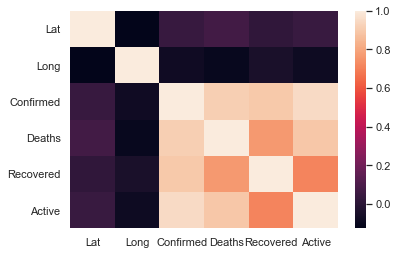

In [178]:
# Correlation Notation

import seaborn as sns
corr = df1.corr()
sns.heatmap(corr,
            xticklabels = corr.columns.values,
            yticklabels = corr.columns.values)


<AxesSubplot:xlabel='Date'>

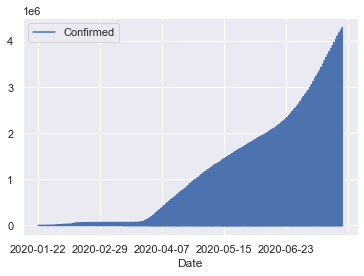

In [179]:
# plotting confirmed cases
df1.plot(x = 'Date', y = 'Confirmed', style = '-')

<AxesSubplot:xlabel='Date'>

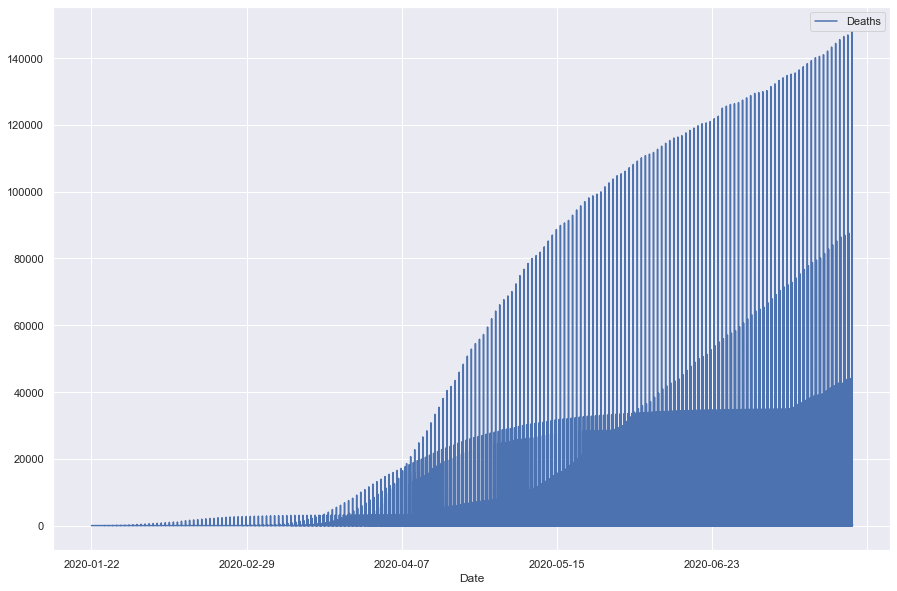

In [222]:
# plotting confirmed cases
df1.plot(x = 'Date', y = 'Deaths', style = '-')

<AxesSubplot:xlabel='Date'>

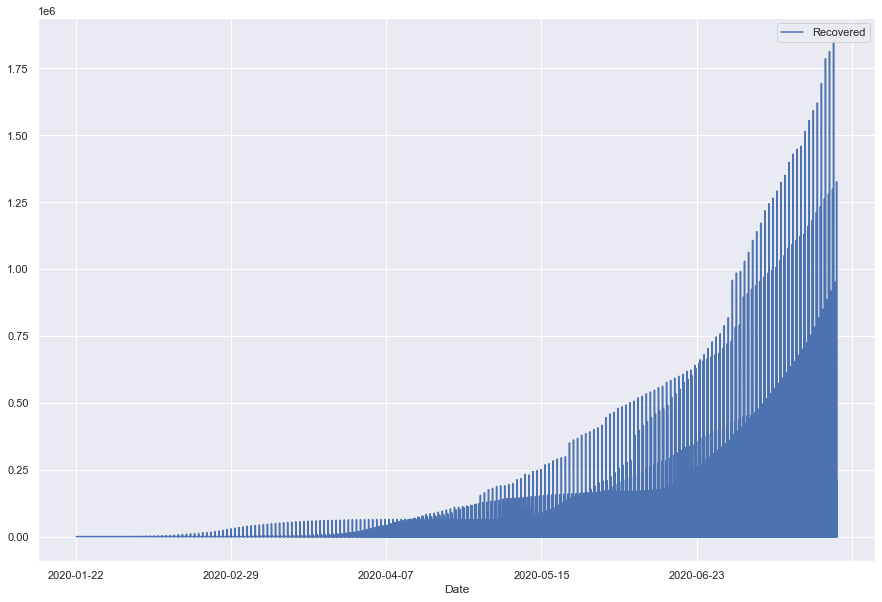

In [223]:
# plotting confirmed cases
df1.plot(x = 'Date', y = 'Recovered', style = '-')

In [78]:
recent_dt = df1[df1['Date']>'2020-06-15']
recent_dt.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
38106,,Afghanistan,33.93911,67.709953,2020-06-16,26310,491,5508,20311,Eastern Mediterranean
38107,,Albania,41.15330,20.168300,2020-06-16,1672,37,1064,571,Europe
38108,,Algeria,28.03390,1.659600,2020-06-16,11147,788,7842,2517,Africa
38109,,Andorra,42.50630,1.521800,2020-06-16,854,52,789,13,Europe
38110,,Angola,-11.20270,17.873900,2020-06-16,148,6,64,78,Africa


In [79]:
world_data = recent_dt[['Country/Region','Lat','Long']]

In [80]:
world_data=world_data.drop_duplicates(subset = ['Country/Region'],keep='first').set_index('Country/Region')
world_data.head()

,Lat,Long
Country/Region,,
Afghanistan,33.93911,67.709953
Albania,41.15330,20.168300
Algeria,28.03390,1.659600
Andorra,42.50630,1.521800
Angola,-11.20270,17.873900


In [81]:
# Adding Cases to the above table
latest_count = recent_dt.groupby('Country/Region').sum()
latest_count.head()

,Lat,Long,Confirmed,Deaths,Recovered,Active
Country/Region,,,,,,
Afghanistan,1425.44262,2843.818026,1370482,37663,730527,602292
Albania,1728.43860,847.068600,130308,3400,74579,52329
Algeria,1177.42380,69.703200,740016,40806,518988,180222
Andorra,1785.26460,63.915600,36325,2184,33587,554
Angola,-470.51340,750.703800,18796,859,5451,12486


In [82]:
# WHO Region Confirmed Cases wrt Months
df_region = df1[['Date','WHO Region','Confirmed']]
df_region['Month'] = pd.DatetimeIndex(df_region['Date']).month
df_region.drop(columns=['Date'],inplace=True)
df_region.sort_values(by='Month',ascending=True,inplace=True)
#df_region['Month'].replace({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun'},inplace=True)
df_region.groupby(['Month','WHO Region']).mean()
df_region.tail()

,WHO Region,Confirmed,Month
44364,Africa,10,7
44363,Africa,2021,7
44362,Europe,1,7
44373,Europe,855,7
49067,Africa,505,7


<AxesSubplot:title={'center':'WHO region average Confirmed Cases'}, xlabel='Month', ylabel='WHO Region'>

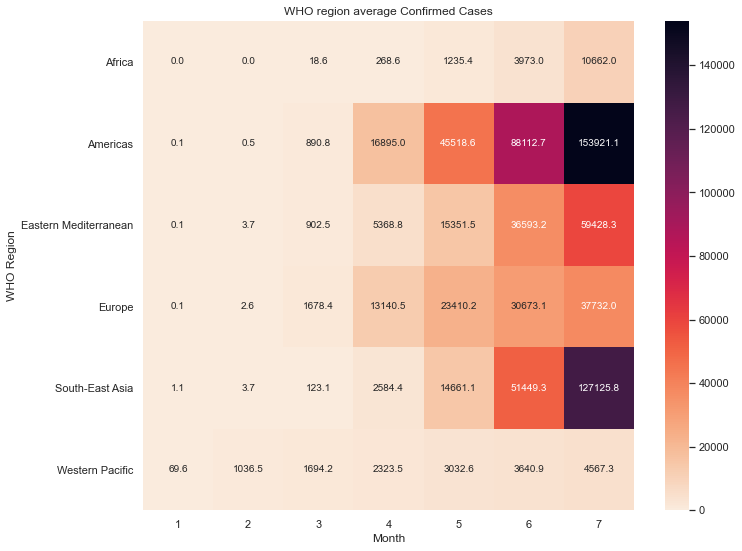

In [180]:
table = pd.pivot_table(df_region, index=df_region['WHO Region'], columns=df_region['Month'], values='Confirmed')
plt.figure(figsize=(11,9))
plt.title("WHO region average Confirmed Cases")
sns.heatmap(data=table,fmt=".1f",annot=True,cmap = sns.cm.rocket_r)

<AxesSubplot:xlabel='Date', ylabel='Active'>

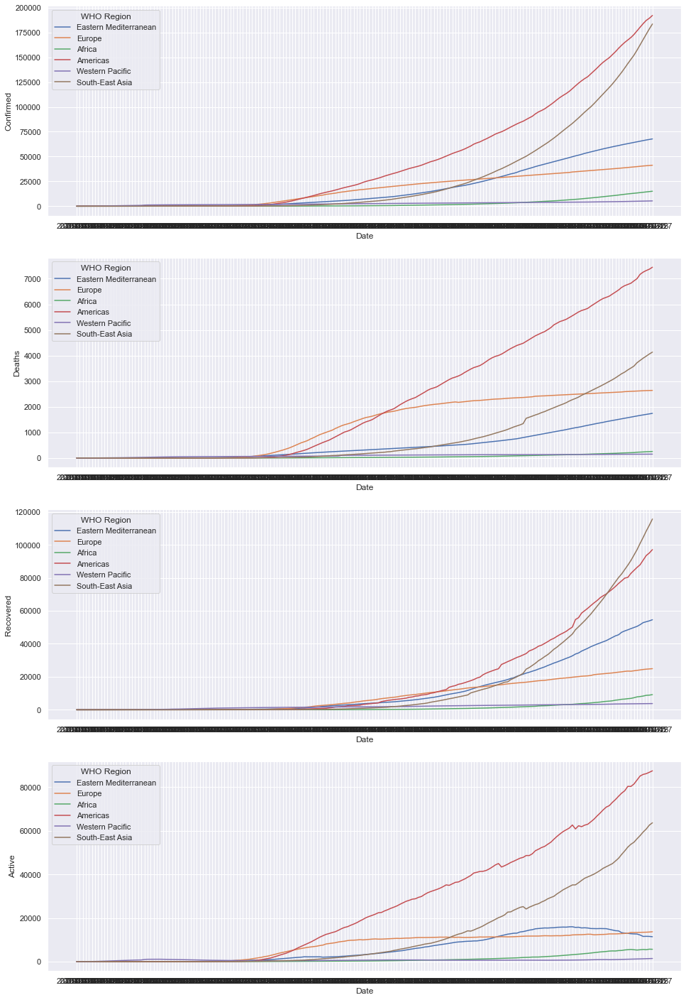

In [182]:
fig, axes = plt.subplots(figsize=(16,25),nrows=4)
sns.lineplot(x="Date", y="Confirmed", hue='WHO Region', data=df1,ci=None,ax=axes[0])
sns.lineplot(x="Date", y="Deaths", hue='WHO Region', data=df1,ci=None,ax=axes[1])
sns.lineplot(x="Date", y="Recovered", hue='WHO Region', data=df1,ci=None,ax=axes[2])
sns.lineplot(x="Date", y="Active", hue='WHO Region', data=df1,ci=None,ax=axes[3])


In [123]:
# Confirmed, deaths and recovered cases for Norway
pd.DataFrame(df1[df1['Country/Region']=='Norway']['Date'].groupby(df1['Province/State']))
pd.DataFrame(df1[df1['Country/Region']=='Norway']['Confirmed'].groupby(df1['Date']).sum()).reset_index()
pd.DataFrame(df1[df1['Country/Region']=='Norway']['Deaths'].groupby(df1['Date']).sum()).reset_index()
n_data = pd.DataFrame(df1[df1['Country/Region']=='Norway'].groupby(df1['Date'])['Confirmed','Deaths','Recovered'].sum().sort_values(by='Confirmed')).reset_index()
n_data.head(20)

,Date,Confirmed,Deaths,Recovered
0,2020-01-22,0,0,0
1,2020-02-11,0,0,0
2,2020-02-12,0,0,0
3,2020-02-14,0,0,0
4,2020-02-15,0,0,0
5,2020-02-16,0,0,0
6,2020-02-17,0,0,0
7,2020-02-10,0,0,0
8,2020-02-18,0,0,0
9,2020-02-20,0,0,0


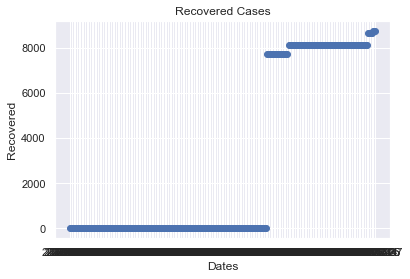

In [183]:
ax = plt.axes()
ax.scatter(n_data.Date, n_data.Recovered)

ax.set(xlabel='Dates',
      ylabel='Recovered',
      title='Recovered Cases');

In [130]:
# Top 5 countries with max cases
# Getting states with maximum no of confirmed cases
latest = df1[df1.Date == '2020-07-27']
max_confirmed_cases = latest.sort_values(by='Confirmed', ascending=False)
top5_countries_confirmed = max_confirmed_cases[0:5]
top5_countries_confirmed

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
49030,,US,40.000000,-100.000000,2020-07-27,4290259,148011,1325804,2816444,Americas
48835,,Brazil,-14.235000,-51.925300,2020-07-27,2442375,87618,1846641,508116,Americas
48936,,India,20.593684,78.962880,2020-07-27,1480073,33408,951166,495499,South-East Asia
48992,,Russia,61.524010,105.318756,2020-07-27,816680,13334,602249,201097,Europe
49005,,South Africa,-30.559500,22.937500,2020-07-27,452529,7067,274925,170537,Africa


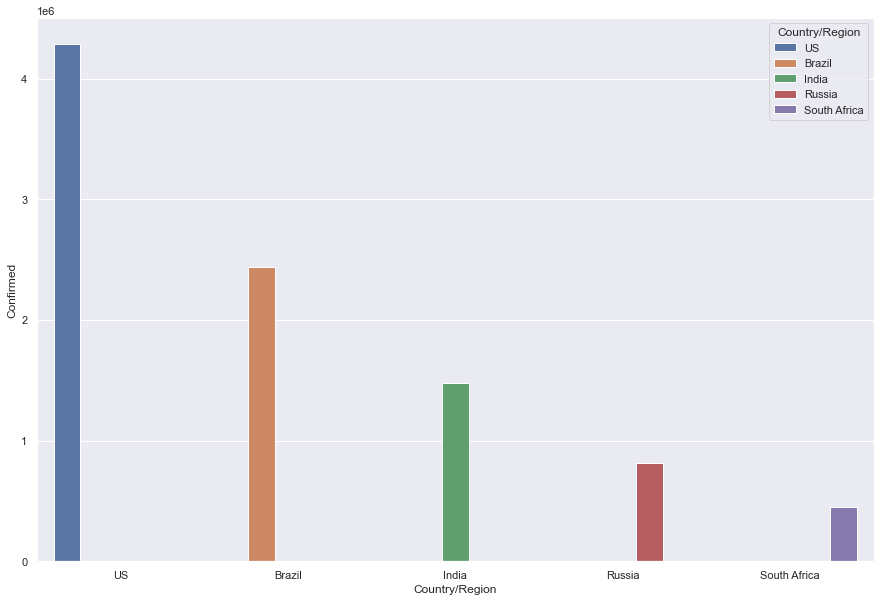

In [184]:
# Making bar-plot for countries with top confirmed cases

sns.set(rc={'figure.figsize':(15,10)})
sns.barplot(x='Country/Region', y='Confirmed', data=top5_countries_confirmed, hue='Country/Region')
plt.show()

In [136]:
# Sorting data wrt no if death cases
max_death_cases = latest.sort_values(by='Deaths', ascending=False)

# Getting countries with maximum no of death cases
top5_countries_deaths = max_death_cases[0:5]
top5_countries_deaths

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
49030,,US,40.00000,-100.00000,2020-07-27,4290259,148011,1325804,2816444,Americas
48835,,Brazil,-14.23500,-51.92530,2020-07-27,2442375,87618,1846641,508116,Americas
49028,,United Kingdom,55.37810,-3.43600,2020-07-27,300111,45759,0,254352,Europe
48963,,Mexico,23.63450,-102.55280,2020-07-27,395489,44022,303810,47657,Americas
48942,,Italy,41.87194,12.56738,2020-07-27,246286,35112,198593,12581,Europe


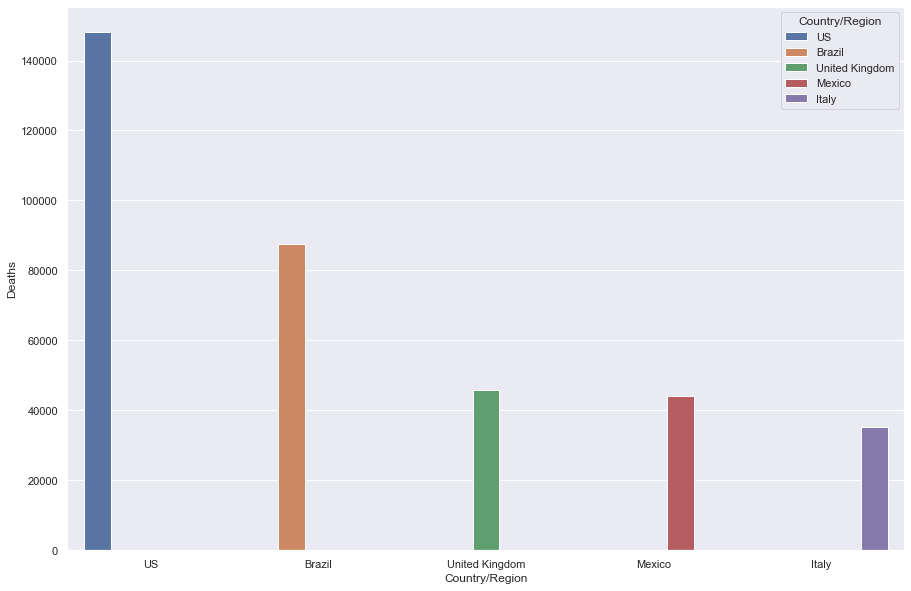

In [185]:
# Making bar-plot for countries with top death cases

sns.set(rc={'figure.figsize':(15,10)})
sns.barplot(x='Country/Region', y='Deaths', data=top5_countries_deaths, hue='Country/Region')
plt.show()



In [139]:
# Sorting data wrt no if recovered cases
max_recovered_cases = latest.sort_values(by='Recovered', ascending=False)
# Getting countries with maximum no of recovered cases
top5_countries_recovered = max_recovered_cases[0:5]
top5_countries_recovered

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
48835,,Brazil,-14.235000,-51.925300,2020-07-27,2442375,87618,1846641,508116,Americas
49030,,US,40.000000,-100.000000,2020-07-27,4290259,148011,1325804,2816444,Americas
48936,,India,20.593684,78.962880,2020-07-27,1480073,33408,951166,495499,South-East Asia
48992,,Russia,61.524010,105.318756,2020-07-27,816680,13334,602249,201097,Europe
48854,,Chile,-35.675100,-71.543000,2020-07-27,347923,9187,319954,18782,Americas


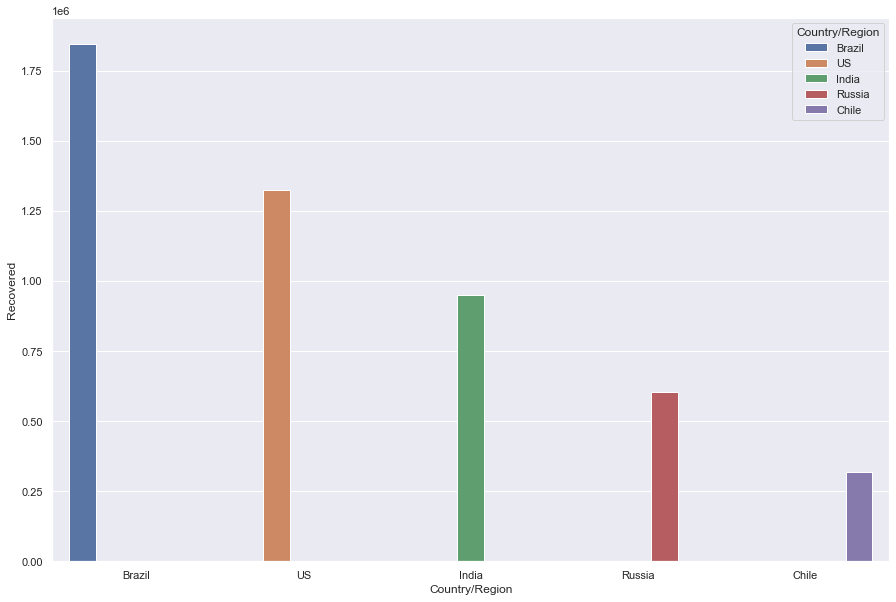

In [186]:
# Making bar-plot for countries with top recovered cases
sns.set(rc={'figure.figsize':(15,10)})
sns.barplot(x='Country/Region', y='Recovered', data=top5_countries_recovered, hue='Country/Region')
plt.show()

In [155]:
# Overall Cases Worlwide
# plotting with plotly express

fig = px.density_mapbox(df1, lat = 'Lat', lon = 'Long', hover_name = 'Country/Region', hover_data = ['Confirmed', 'Recovered', 'Deaths'], animation_frame = 'Date', color_continuous_scale='Portland', radius=7, zoom=0, height=700)

fig.update_layout(title = 'Worlwide Covid-19 Cases in Time')
fig.update_layout(mapbox_style = 'open-street-map', mapbox_center_lon = 0)

fig.show()

In [156]:
# Over time Cases
time_laps = df1.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
time_laps

,Date,Recovered,Deaths,Active
0,2020-01-22,28,17,510
1,2020-01-23,30,18,606
2,2020-01-24,36,26,879
3,2020-01-25,39,42,1353
4,2020-01-26,52,56,2010
...,...,...,...,...
183,2020-07-23,8710969,633506,6166006
184,2020-07-24,8939705,639650,6212290
185,2020-07-25,9158743,644517,6243930
186,2020-07-26,9293464,648621,6309711


In [158]:
# get data in a melt format

time_line = df1.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()

time_line = time_line.melt(id_vars='Date', value_vars=['Recovered', 'Deaths', 'Active'], var_name='Case', value_name='Count')


# create figure
fig = px.area(time_line, x='Date', y='Count', color='Case', height=600, title='Cases over time')
# update figure
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

# Worldometer_data_df

In [90]:
countries = worldometer_data_df[['Country/Region','Continent','Population','TotalTests',
                             'WHO Region','TotalCases','TotalDeaths','TotalRecovered']]

countries.head()

,Country/Region,Continent,Population,TotalTests,WHO Region,TotalCases,TotalDeaths,TotalRecovered
0,USA,North America,3.311981e+08,63139605.0,Americas,5032179,162804.0,2576668.0
1,Brazil,South America,2.127107e+08,13206188.0,Americas,2917562,98644.0,2047660.0
2,India,Asia,1.381345e+09,22149351.0,South-EastAsia,2025409,41638.0,1377384.0
3,Russia,Europe,1.459409e+08,29716907.0,Europe,871894,14606.0,676357.0
4,South Africa,Africa,5.938157e+07,3149807.0,Africa,538184,9604.0,387316.0


In [96]:
# Continenets Total Tests according to Population
countries.loc[ : , ['Population']] = countries['Population'].apply(np.int64)
countries.loc[ : , ['TotalTests']] = countries['TotalTests'].apply(np.int64)
countries.loc[ : , ['TotalDeaths']] = countries['TotalDeaths'].apply(np.int64)
countries.loc[ : , ['TotalRecovered']] = countries['TotalRecovered'].apply(np.int64)

In [97]:
countries.groupby(['Continent'], as_index=False)['Population', 'TotalTests'].sum()

,Continent,Population,TotalTests
0,Africa,1343515489,8673853
1,Asia,3173656415,65353821
2,Australia/Oceania,40957909,5152811
3,Europe,747677546,96125611
4,North America,589503467,70173584
5,South America,431110464,22379618


In [159]:
# Checking for Europe
countries[countries['Continent'] == 'Europe'].head(5)

,Country/Region,Continent,Population,TotalTests,WHO Region,TotalCases,TotalDeaths,TotalRecovered
3,Russia,Europe,145940924,29716907,Europe,871894,14606,676357
9,Spain,Europe,46756648,7064329,Europe,354530,28500,0
11,UK,Europe,67922029,17515234,Europe,308134,46413,0
15,Italy,Europe,60452568,7099713,Europe,249204,35187,201323
18,Germany,Europe,83811260,8586648,Europe,215210,9252,196200


In [99]:
# Checking for Norway
countries[countries['Country/Region'] == 'Norway']

,Country/Region,Continent,Population,TotalTests,WHO Region,TotalCases,TotalDeaths,TotalRecovered
81,Norway,Europe,5425471,472841,Europe,9468,256,8857


In [114]:
# country wise total cases,deaths and recovered and total tests done sorted by total cases
country_cases = pd.DataFrame(countries.loc[: , ['Country/Region', 'TotalCases', 'TotalDeaths', 'TotalRecovered']].values, columns=['Country/Region',
                                                                                                                              'TotalCases','TotalDeaths','TotalRecovered'])

country_cases.set_index('Country/Region', inplace=True)

country_cases.sort_values(by=['TotalCases'], ascending=False).head(10)

,TotalCases,TotalDeaths,TotalRecovered
Country/Region,,,
USA,5032179,162804,2576668
Brazil,2917562,98644,2047660
India,2025409,41638,1377384
Russia,871894,14606,676357
South Africa,538184,9604,387316
Mexico,462690,50517,308848
Peru,455409,20424,310337
Chile,366671,9889,340168
Colombia,357710,11939,192355


In [142]:
# Norway
n_data = df1[df1['Country/Region']=='Norway']
n_data

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
173,,Norway,60.472,8.4689,2020-01-22,0,0,0,0,Europe
434,,Norway,60.472,8.4689,2020-01-23,0,0,0,0,Europe
695,,Norway,60.472,8.4689,2020-01-24,0,0,0,0,Europe
956,,Norway,60.472,8.4689,2020-01-25,0,0,0,0,Europe
1217,,Norway,60.472,8.4689,2020-01-26,0,0,0,0,Europe
...,...,...,...,...,...,...,...,...,...,...
47936,,Norway,60.472,8.4689,2020-07-23,9085,255,8674,156,Europe
48197,,Norway,60.472,8.4689,2020-07-24,9092,255,8674,163,Europe
48458,,Norway,60.472,8.4689,2020-07-25,9111,255,8674,182,Europe
48719,,Norway,60.472,8.4689,2020-07-26,9117,255,8752,110,Europe


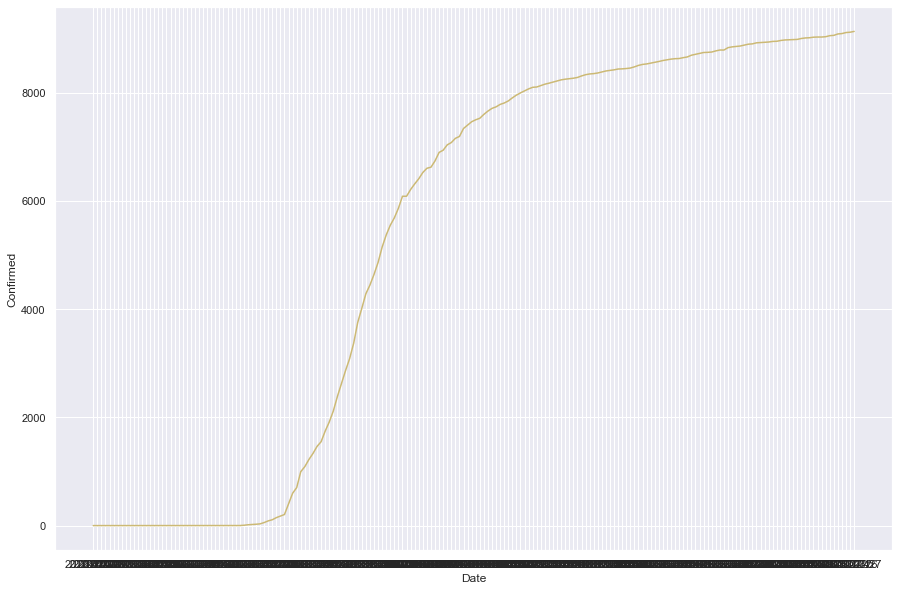

In [190]:
# Visualizing confirmed cases in Norway
sns.set(rc={'figure.figsize':(15,10)})
sns.lineplot(x='Date', y='Confirmed', data=n_data, color='y')
plt.show()

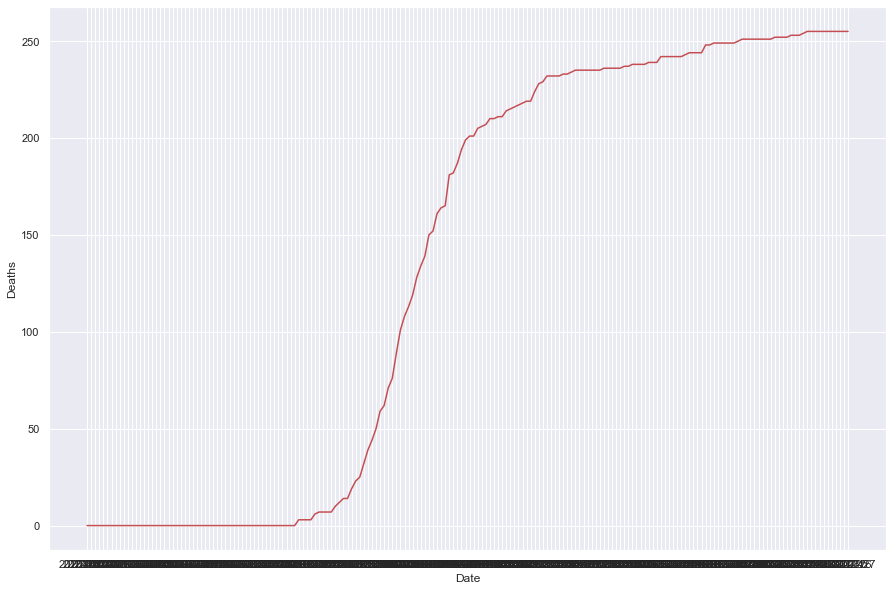

In [188]:
# Visualizing death cases in Norway
sns.set(rc={'figure.figsize':(15,10)})
sns.lineplot(x='Date', y='Deaths', data=n_data, color='r')
plt.show()

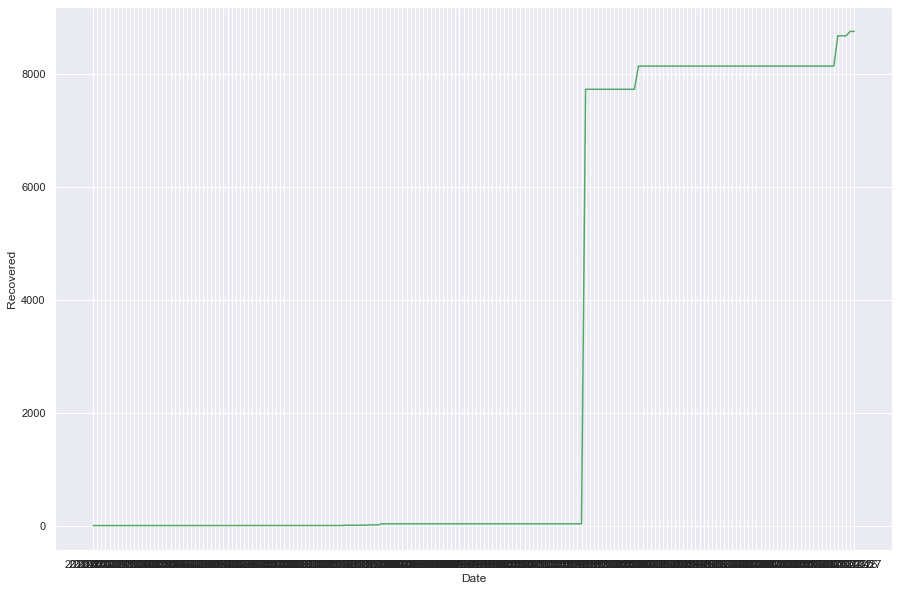

In [191]:
# Visualizing recovered cases in Norway
sns.set(rc={'figure.figsize':(15,10)})
sns.lineplot(x='Date', y='Recovered', data=n_data, color='g')
plt.show()

# full_grouped_df

In [109]:
latest_cases = cases = full_grouped_df[['Date','Country/Region','New cases','New deaths','New recovered','WHO Region','Confirmed','Deaths','Recovered']]

In [111]:
# Getting the latest date cases
latest_cases[latest_cases['Date'] == '2020-06-10']

,Date,Country/Region,New cases,New deaths,New recovered,WHO Region,Confirmed,Deaths,Recovered
26180,2020-06-10,Afghanistan,683,21,362,Eastern Mediterranean,22142,405,3013
26181,2020-06-10,Albania,42,0,20,Europe,1341,34,980
26182,2020-06-10,Algeria,102,8,123,Africa,10484,732,7074
26183,2020-06-10,Andorra,0,0,2,Europe,852,51,759
26184,2020-06-10,Angola,17,0,2,Africa,113,4,40
...,...,...,...,...,...,...,...,...,...
26362,2020-06-10,West Bank and Gaza,4,0,6,Eastern Mediterranean,485,3,410
26363,2020-06-10,Western Sahara,0,0,0,Africa,9,1,6
26364,2020-06-10,Yemen,36,2,0,Eastern Mediterranean,560,129,23
26365,2020-06-10,Zambia,0,0,0,Africa,1200,10,912


In [112]:
# latest cases for Norway

latest_cases[latest_cases['Country/Region'] == 'Norway'].groupby(['Country/Region'], as_index=False)['New cases', 'New deaths'].sum()



,Country/Region,New cases,New deaths
0,Norway,9132,255


# usa_county_wise

In [146]:
# By Province/State
usa_states = usa_county_wise_df[usa_county_wise_df['Province_State']=='Puerto Rico']
usa_states

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,Combined_Key,Date,Confirmed,Deaths
3,63072001,PR,PRI,630,72001.0,Adjuntas,Puerto Rico,US,18.180117,-66.754367,"Adjuntas, Puerto Rico, US",2020-01-22,0,0
4,63072003,PR,PRI,630,72003.0,Aguada,Puerto Rico,US,18.360255,-67.175131,"Aguada, Puerto Rico, US",2020-01-22,0,0
5,63072005,PR,PRI,630,72005.0,Aguadilla,Puerto Rico,US,18.459681,-67.120815,"Aguadilla, Puerto Rico, US",2020-01-22,0,0
6,63072007,PR,PRI,630,72007.0,Aguas Buenas,Puerto Rico,US,18.251619,-66.126806,"Aguas Buenas, Puerto Rico, US",2020-01-22,0,0
7,63072009,PR,PRI,630,72009.0,Aibonito,Puerto Rico,US,18.131361,-66.264131,"Aibonito, Puerto Rico, US",2020-01-22,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624658,63072149,PR,PRI,630,72149.0,Villalba,Puerto Rico,US,18.127951,-66.473115,"Villalba, Puerto Rico, US",2020-07-27,70,0
624659,63072151,PR,PRI,630,72151.0,Yabucoa,Puerto Rico,US,18.070399,-65.896289,"Yabucoa, Puerto Rico, US",2020-07-27,81,0
624660,63072153,PR,PRI,630,72153.0,Yauco,Puerto Rico,US,18.080374,-66.858814,"Yauco, Puerto Rico, US",2020-07-27,182,0
627843,63072888,PR,PRI,630,72888.0,Out of PR,Puerto Rico,US,0.000000,0.000000,"Out of PR, Puerto Rico, US",2020-07-27,537,0


In [160]:
df3 = usa_county_wise_df.copy()

In [163]:
# Cases by Province
df3 = df3[['Date', 'Province_State', 'Deaths', 'Confirmed']]
df3.head()

,Date,Province_State,Deaths,Confirmed
0,2020-01-22,American Samoa,0,0
1,2020-01-22,Guam,0,0
2,2020-01-22,Northern Mariana Islands,0,0
3,2020-01-22,Puerto Rico,0,0
4,2020-01-22,Puerto Rico,0,0


In [165]:
last_cases = df3[df3['Date']=='7/27/20']
last_cases

,Date,Province_State,Deaths,Confirmed
624580,2020-07-27,American Samoa,0,0
624581,2020-07-27,Guam,5,349
624582,2020-07-27,Northern Mariana Islands,2,40
624583,2020-07-27,Puerto Rico,0,77
624584,2020-07-27,Puerto Rico,0,92
...,...,...,...,...
627915,2020-07-27,Utah,1,347
627916,2020-07-27,Utah,0,70
627917,2020-07-27,Utah,23,2781
627918,2020-07-27,Utah,0,142


In [167]:
top_5_states = last_cases.sort_values(by='Confirmed', ascending=False).head()
top_5_states

,Date,Province_State,Deaths,Confirmed
626520,2020-07-27,New York,23500,224051
624866,2020-07-27,California,4375,176028
624765,2020-07-27,Arizona,1807,109988
625024,2020-07-27,Florida,1404,107315
625272,2020-07-27,Illinois,4842,103008


In [168]:
# Plotting top5 states
plt.figure(figsize=(15,10))
sns.barplot(x='Province_State', y='Confirmed', data=top_5_states)
plt.show()

In [169]:
bottom_5_states = last_cases.sort_values(by='Confirmed',ascending=True).head()
bottom_5_states

,Date,Province_State,Deaths,Confirmed
624580,2020-07-27,American Samoa,0,0
627834,2020-07-27,New Jersey,0,0
627833,2020-07-27,New Hampshire,0,0
627832,2020-07-27,Nevada,0,0
627831,2020-07-27,Nebraska,0,0


In [170]:
plt.figure(figsize=(15,10))
sns.barplot(x='Province_State', y='Confirmed', data=bottom_5_states)
plt.show()

In [172]:
df3['Province_State'].value_counts()

Texas                       48128
Georgia                     30268
Virginia                    25380
Kentucky                    22936
Missouri                    22184
Kansas                      20116
Illinois                    19552
North Carolina              19176
Iowa                        18988
Tennessee                   18236
Nebraska                    17860
Indiana                     17672
Ohio                        16920
Minnesota                   16732
Michigan                    16356
Mississippi                 15792
Puerto Rico                 15040
Oklahoma                    14852
Arkansas                    14476
Wisconsin                   13912
Pennsylvania                12972
Florida                     12972
Alabama                     12972
South Dakota                12784
Colorado                    12408
Louisiana                   12408
New York                    12032
California                  11280
Montana                     10904
West Virginia 

# country_wise_latest_df

In [147]:
df2 = country_wise_latest_df.copy()

In [148]:
# creating new attributes as % increase in new cases, recoveries and deaths
df2['%Inc Cases'] = df2['New cases']/df2['Confirmed']*100
df2['%Inc Deaths'] = df2['New deaths']/df2['Deaths']*100
df2['%Inc Recovered'] = df2['New recovered']/df2['Recovered']*100

In [149]:
df2.head(5)

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region,%Inc Cases,%Inc Deaths,%Inc Recovered
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean,0.292309,0.788022,0.071434
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe,2.397541,4.166667,2.295082
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa,2.202123,0.687876,3.976217
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe,1.102536,0.000000,0.000000
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa,1.894737,2.439024,0.000000


In [154]:
# %increase in cases
# plot bar graph
# create a new column
per = np.round(df2[['%Inc Cases', '%Inc Deaths', '%Inc Recovered']].loc[0], 2)

percentage_df = pd.DataFrame(per)
percentage_df.columns = ['Percentage']

fig = go.Figure()

fig.add_trace(go.Bar(x = percentage_df.index, y = percentage_df['Percentage'], marker_color = ['Yellow', 'red', 'green']))
fig.show()